In [4]:
import os
import warnings
warnings.filterwarnings('ignore')
data = pd.read_csv('insurance.csv')

In [6]:
data

,age,sex,bmi,children,smoker,region,charges
0,19,female,27.900,0,yes,southwest,16884.92400
1,18,male,33.770,1,no,southeast,1725.55230
2,28,male,33.000,3,no,southeast,4449.46200
3,33,male,22.705,0,no,northwest,21984.47061
4,32,male,28.880,0,no,northwest,3866.85520
...,...,...,...,...,...,...,...
1333,50,male,30.970,3,no,northwest,10600.54830
1334,18,female,31.920,0,no,northeast,2205.98080
1335,18,female,36.850,0,no,southeast,1629.83350
1336,21,female,25.800,0,no,southwest,2007.94500


In [7]:
data.head()

,age,sex,bmi,children,smoker,region,charges
0,19,female,27.900,0,yes,southwest,16884.92400
1,18,male,33.770,1,no,southeast,1725.55230
2,28,male,33.000,3,no,southeast,4449.46200
3,33,male,22.705,0,no,northwest,21984.47061
4,32,male,28.880,0,no,northwest,3866.85520


In [9]:
# There seems to be no Nan Data - Lucky Day :)
data.isnull().sum()

age         0
sex         0
bmi         0
children    0
smoker      0
region      0
charges     0
dtype: int64

In [10]:
from sklearn.preprocessing import LabelEncoder

# sex
le = LabelEncoder()
le.fit(data.sex.drop_duplicates())
data.sex = le.transform(data.sex)

# smoker or not
le.fit(data.smoker.drop_duplicates())
data.smoker = le.transform(data.smoker)

# region
le.fit(data.region.drop_duplicates())
data.region = le.transform(data.region)

In [12]:
data['charges'].describe()

count     1338.000000
mean     13270.422265
std      12110.011237
min       1121.873900
25%       4740.287150
50%       9382.033000
75%      16639.912515
max      63770.428010
Name: charges, dtype: float64

In [13]:
data.corr()['charges'].sort_values()

region     -0.006208
sex         0.057292
children    0.067998
bmi         0.198341
age         0.299008
smoker      0.787251
charges     1.000000
Name: charges, dtype: float64

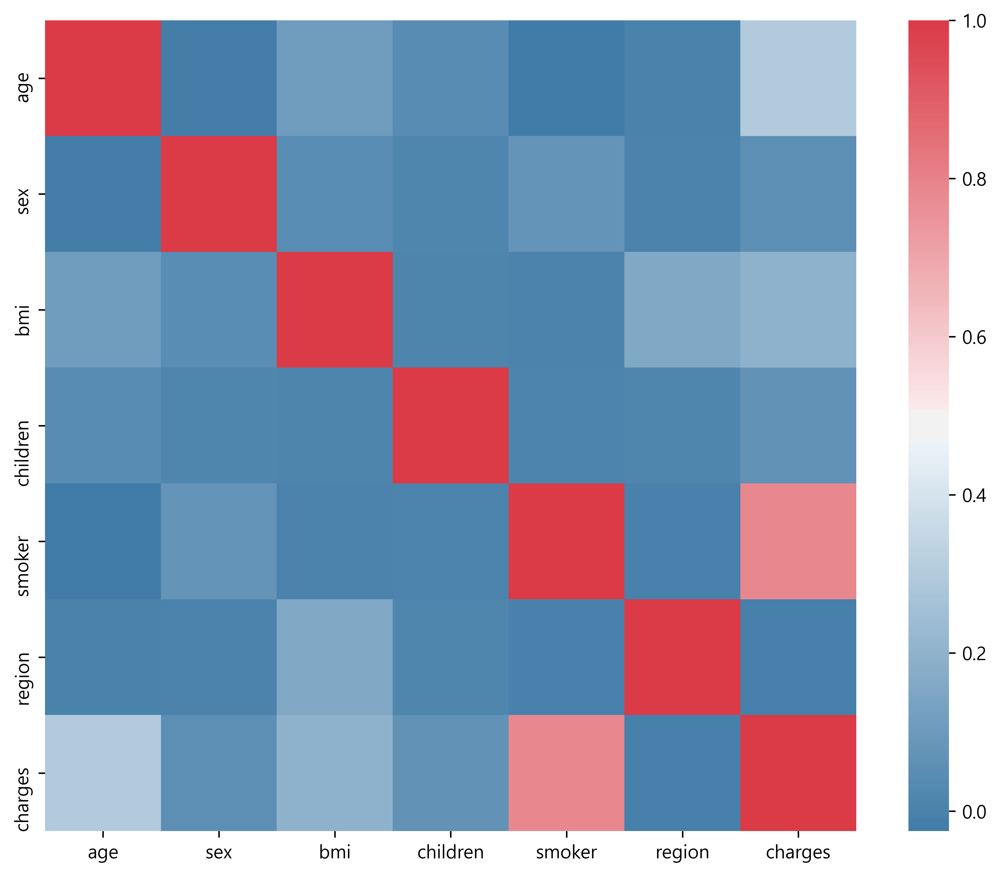

In [14]:
f, ax = plt.subplots(figsize=(10, 8))
corr = data.corr()
sns.heatmap(corr, mask=np.zeros_like(corr, dtype=np.bool), 
            cmap=sns.diverging_palette(240, 10, as_cmap=True),
           square=True, ax=ax)

A strong correlation is observed between smoking of the patient and the charges

In [24]:
from bokeh.io import output_notebook, show
from bokeh.plotting import figure
output_notebook()
import scipy.special
from bokeh.layouts import gridplot
from bokeh.plotting import figure, show, output_file

p = figure(title="Distribution of charges", tools="save", background_fill_color="#E8DDCB")
hist, edges = np.histogram(data.charges)
p.quad(top=hist, bottom=0, left=edges[:-1], right=edges[1:], fill_color="#036564", line_color="#033549")
p.xaxis.axis_label = 'x'
p.yaxis.axis_label = 'Pr(x)'
show(gridplot(p,ncols = 2, plot_width=400, plot_height=400, toolbar_location=None))

Loading BokehJS ...

TypeError: 'Figure' object is not iterable

Text(0.5, 1.0, 'Distribution of charges for non-smokers')

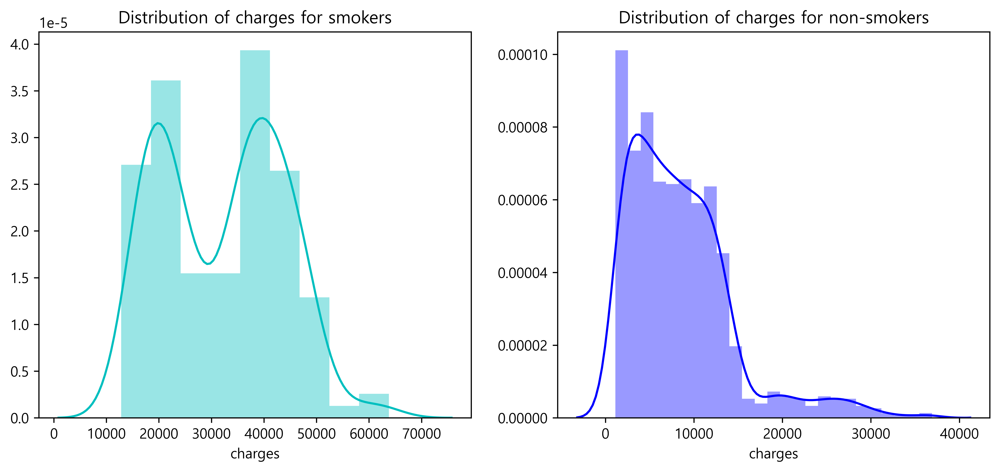

In [25]:
f = plt.figure(figsize=(12, 5))

ax=f.add_subplot(121)
sns.distplot(data[(data.smoker==1)]["charges"], color='c', ax=ax)
ax.set_title('Distribution of charges for smokers')

ax=f.add_subplot(122)
sns.distplot(data[(data.smoker==0)]['charges'], color='b', ax=ax)
ax.set_title('Distribution of charges for non-smokers')

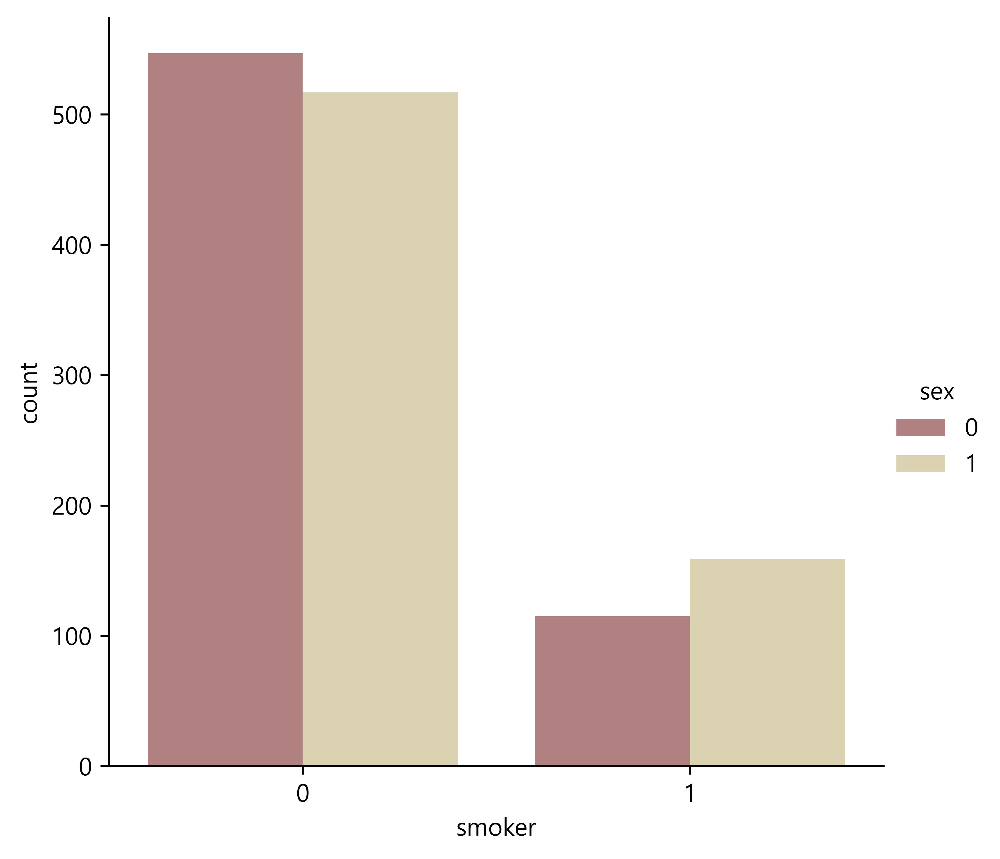

In [27]:
sns.catplot(x='smoker', kind='count', hue='sex', palette='pink', data=data)

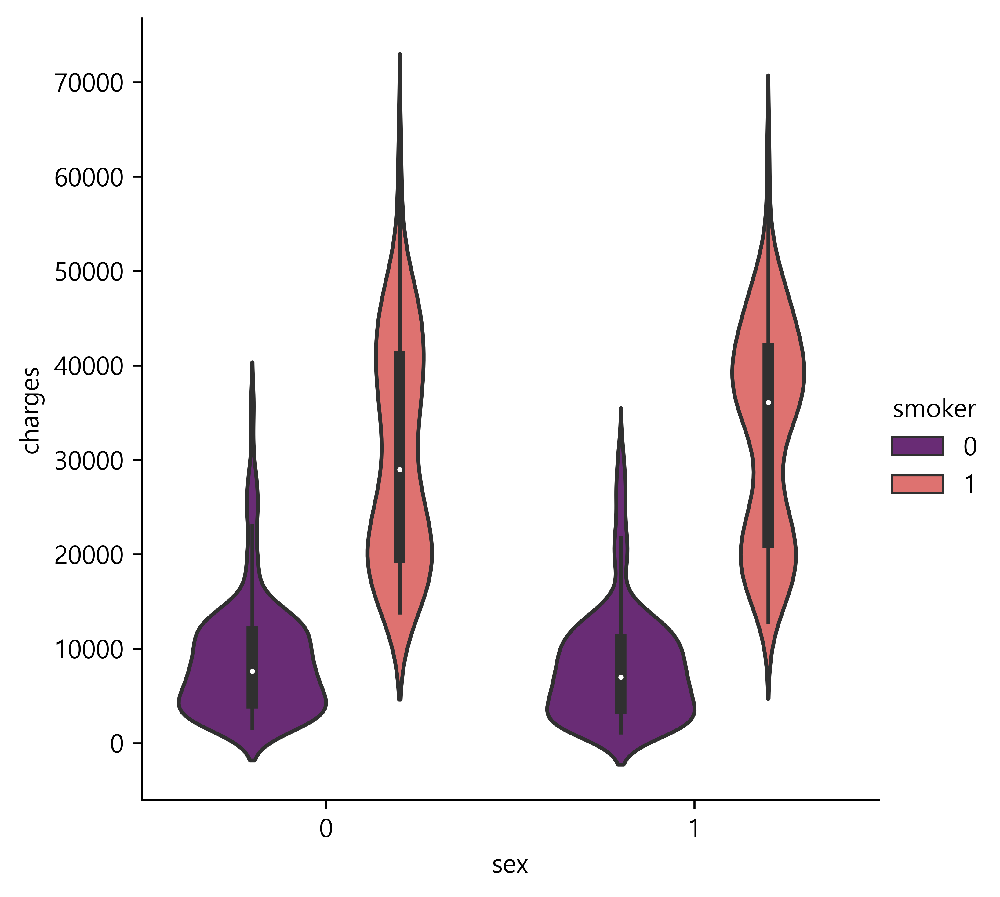

In [28]:
sns.catplot(x="sex", y="charges", hue="smoker", kind="violin", data=data, palette= 'magma')

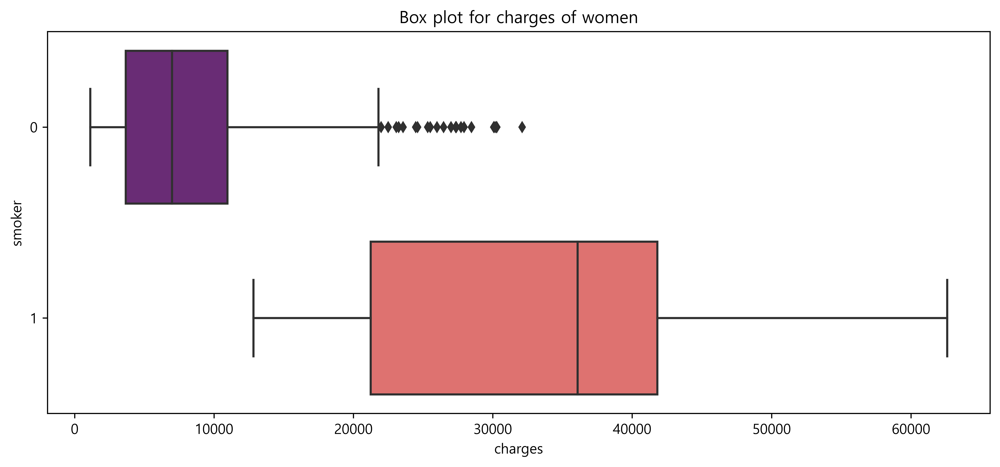

In [29]:
plt.figure(figsize=(12, 5))
plt.title("Box plot for charges of women")
sns.boxplot(y="smoker", x="charges", data=data[(data.sex==1)], orient="h", palette='magma')

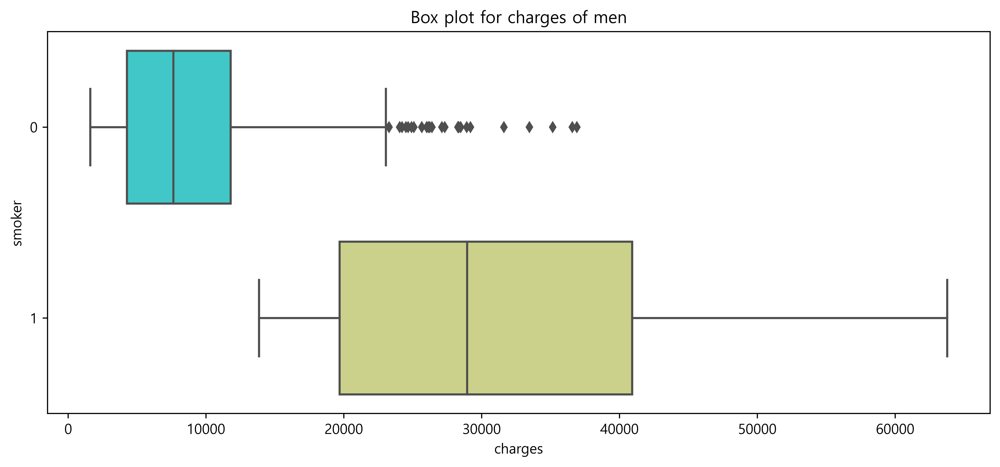

In [30]:
plt.figure(figsize=(12, 5))
plt.title("Box plot for charges of men")
sns.boxplot(y="smoker", x="charges", data=data[(data.sex==0)], orient="h", palette="rainbow")

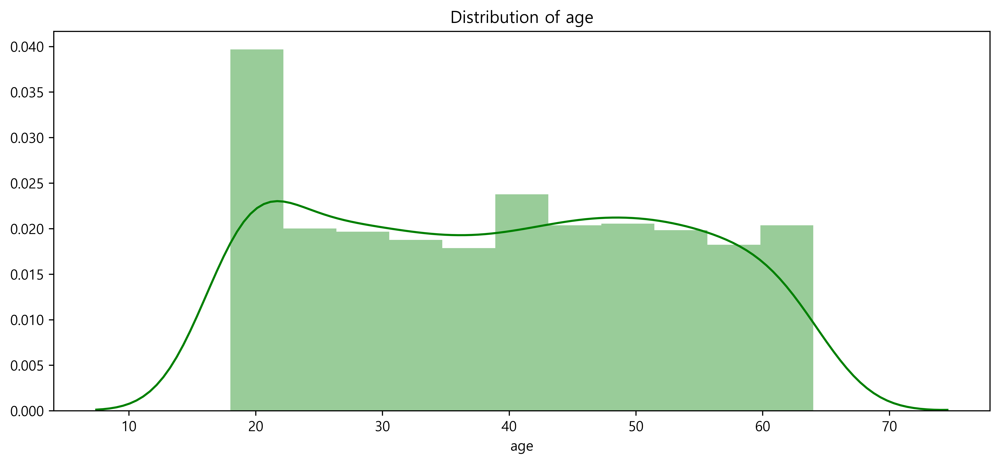

In [31]:
plt.figure(figsize=(12, 5))
plt.title("Distribution of age")
ax = sns.distplot(data["age"], color='g')

Text(0.5, 1.0, 'The number of smokers and non-smokers (18 years old)')

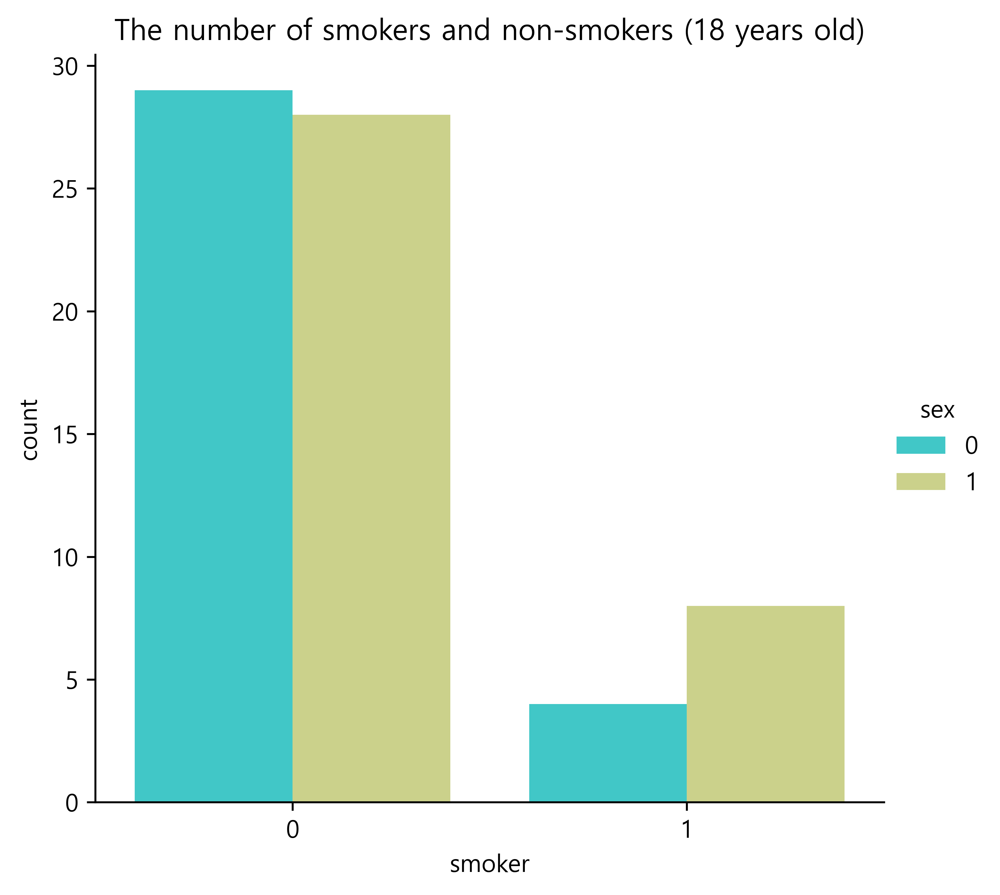

In [33]:
sns.catplot(x="smoker", kind="count", hue="sex", palette="rainbow", data=data[(data.age==18)])
plt.title("The number of smokers and non-smokers (18 years old)")

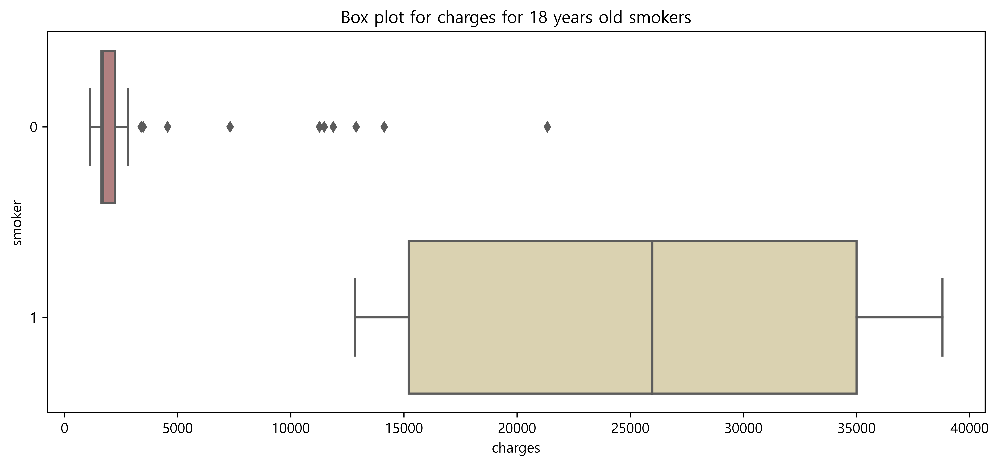

In [34]:
plt.figure(figsize=(12, 5))
plt.title("Box plot for charges for 18 years old smokers")
sns.boxplot(y="smoker", x="charges", data=data[(data.age==18)], orient="h", palette="pink")

Text(0.5, 1.0, 'Distribution of charges and age for non-smokers')

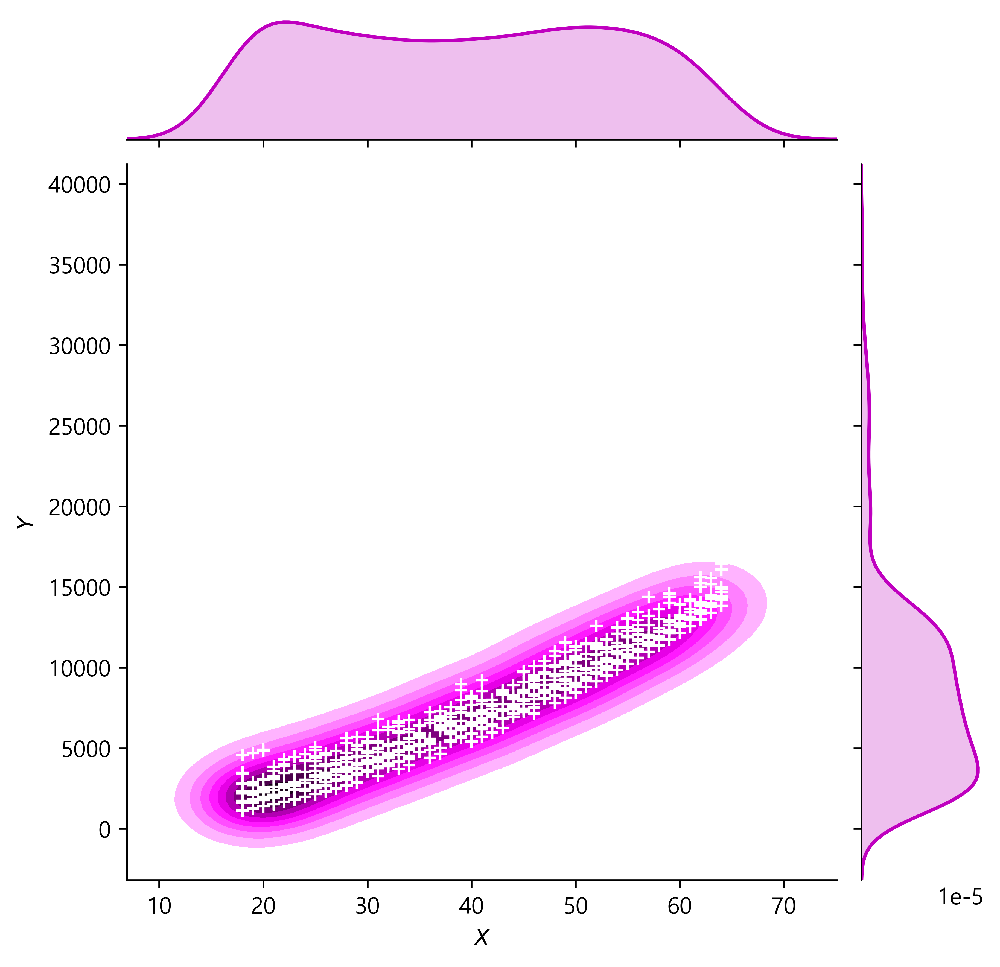

In [35]:
g = sns.jointplot(x="age", y="charges", data=data[(data.smoker==0)], kind="kde", color="m")
g.plot_joint(plt.scatter, c="w", s=30, linewidth=1, marker="+")
g.ax_joint.collections[0].set_alpha(0)
g.set_axis_labels("$X$", "$Y$")
ax.set_title("Distribution of charges and age for non-smokers")

Text(0.5, 1.0, 'Distribution of charges and age for smokers')

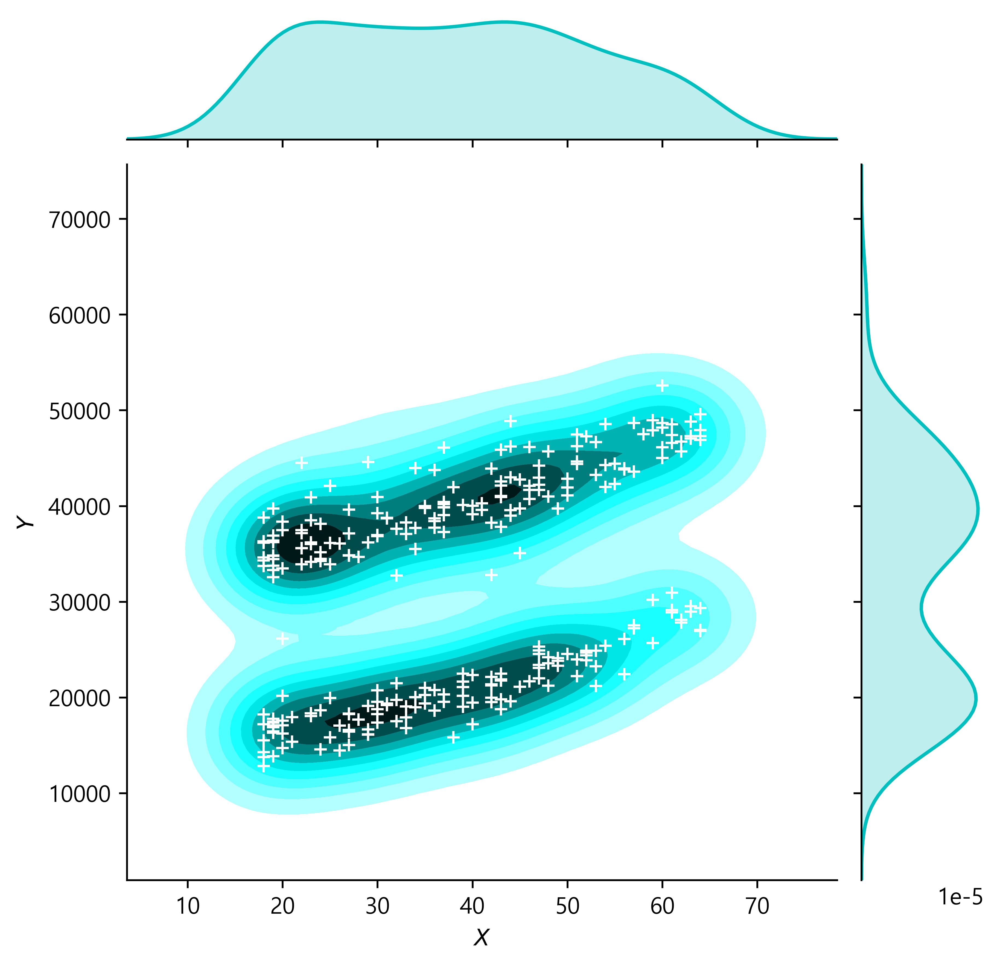

In [36]:
g = sns.jointplot(x="age", y="charges", data = data[(data.smoker==1)], kind="kde", color="c")
g.plot_joint(plt.scatter, c="w", s=30, linewidth=1, marker="+")
g.ax_joint.collections[0].set_alpha(0)
g.set_axis_labels("$X$", "$Y$")
ax.set_title("Distribution of charges and age for smokers")

In [37]:
# non-smokers
p = figure(plot_width=500, plot_height=450)
p.circle(x=data[(data.smoker==0)].age, y=data[(data.smoker==0)].charges, size=7, line_color="navy", fill_color="pink", fill_alpha=0.9)
show(p)

In [38]:
# smokers
p = figure(plot_width=500, plot_height=450)
p.circle(x=data[(data.smoker==1)].age, y=data[(data.smoker==1)].charges, size=7, line_color="navy", fill_color="red", fill_alpha=0.9)
show(p)

Text(0.5, 1.0, 'Smokers and Non-Smokers')

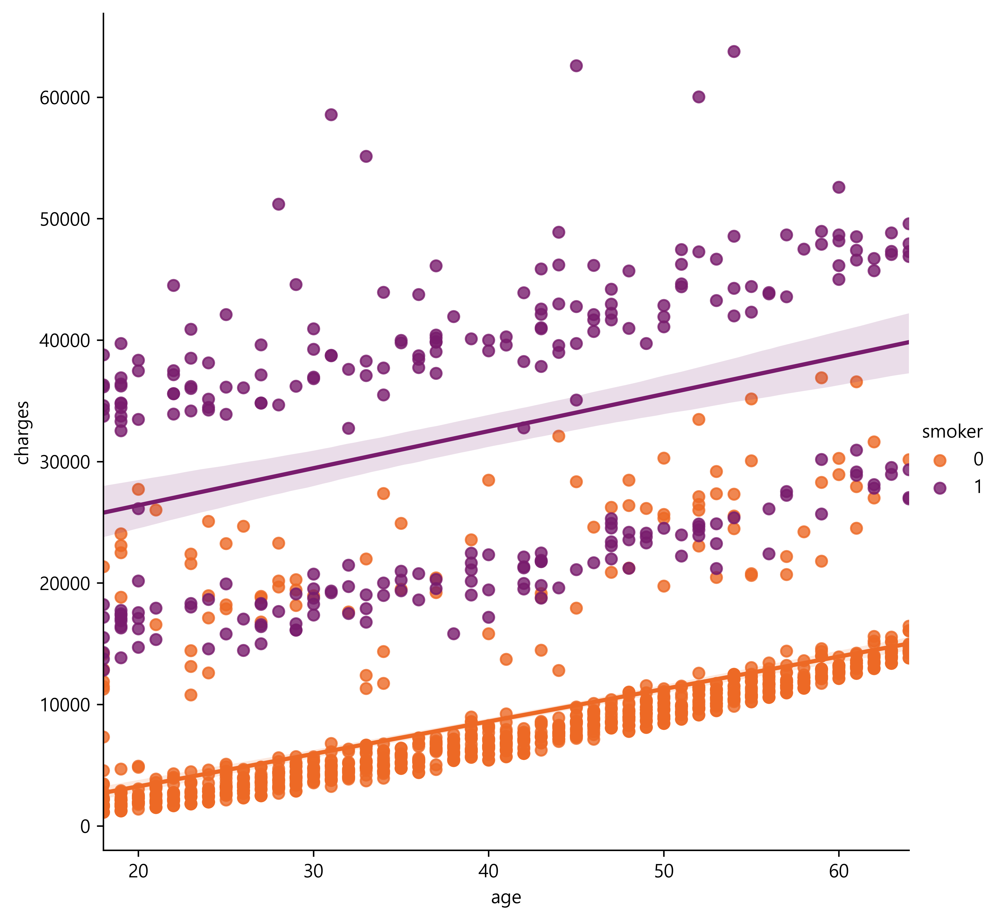

In [39]:
sns.lmplot(x="age", y="charges", hue="smoker", data=data, palette="inferno_r", size=7)
ax.set_title("Smokers and Non-Smokers")

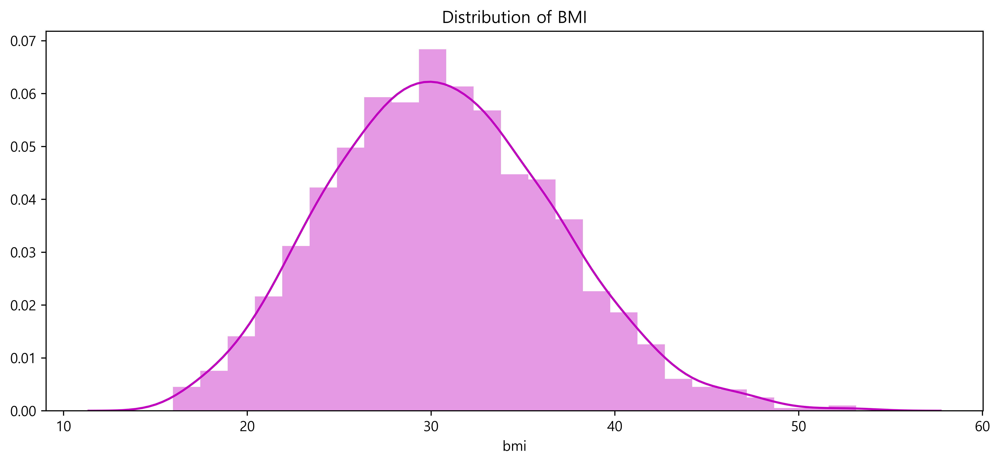

In [40]:
plt.figure(figsize=(12, 5))
plt.title("Distribution of BMI")
ax = sns.distplot(data["bmi"], color="m")

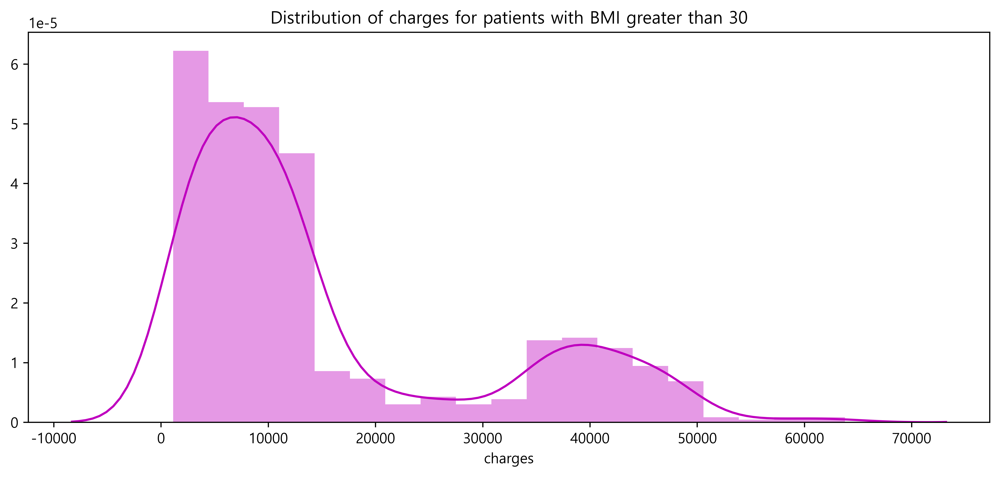

In [41]:
plt.figure(figsize=(12, 5))
plt.title("Distribution of charges for patients with BMI greater than 30")
ax = sns.distplot(data[(data.bmi>=30)]['charges'], color="m")

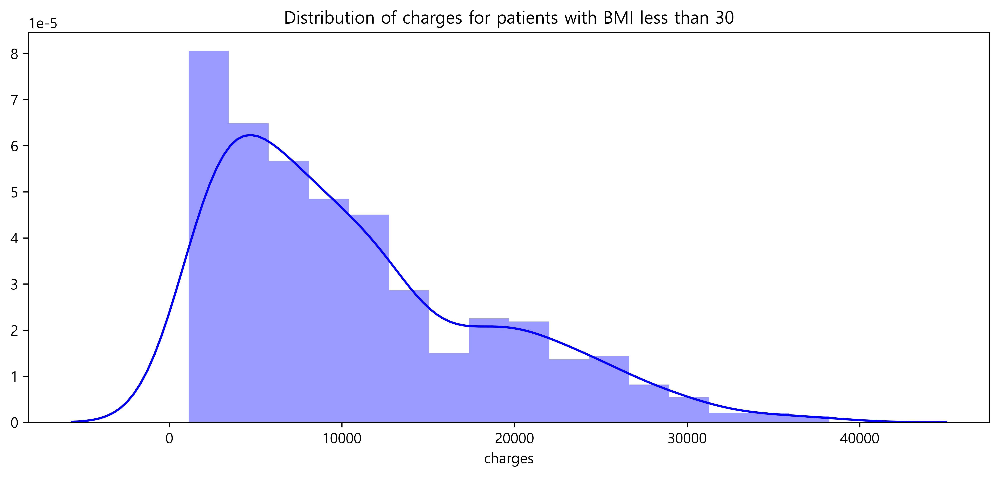

In [42]:
plt.figure(figsize=(12, 5))
plt.title("Distribution of charges for patients with BMI less than 30")
ax = sns.distplot(data[(data.bmi<30)]['charges'], color="b")

Text(0.5, 1.0, 'Distribution of BMI and charges')

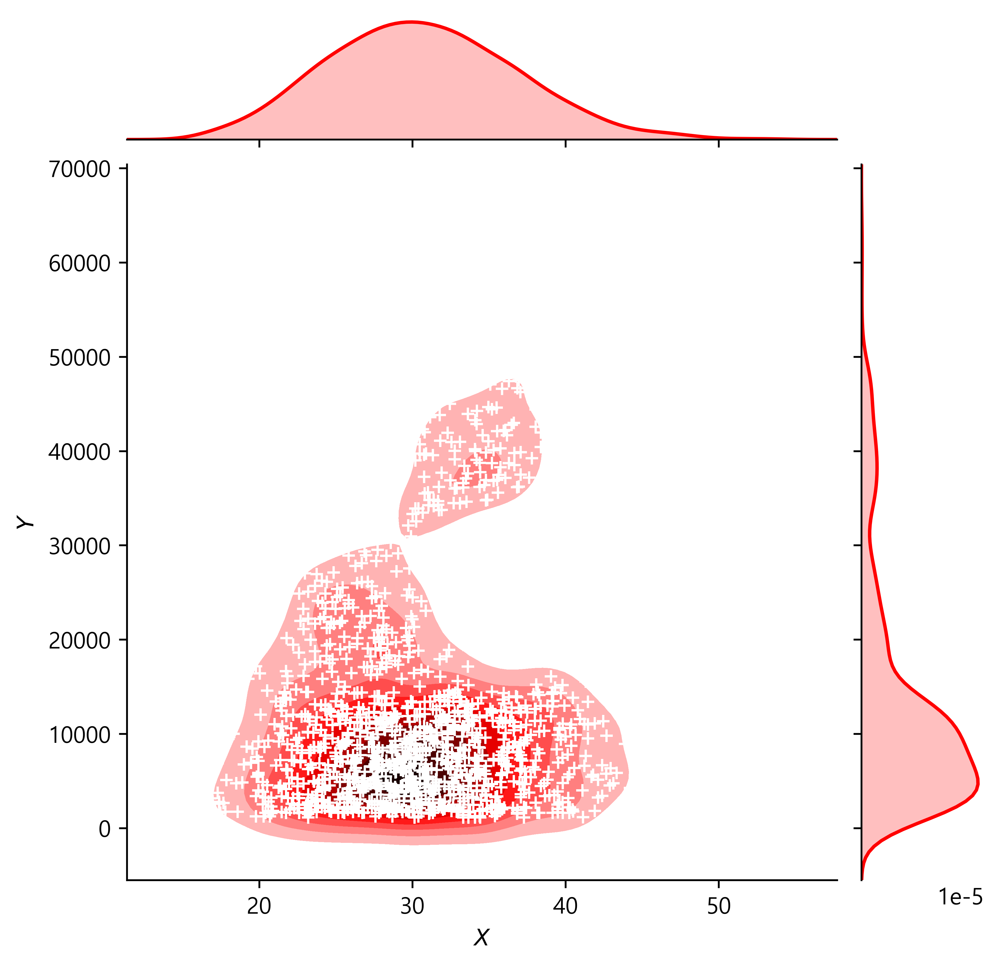

In [44]:
g = sns.jointplot(x="bmi", y="charges", data=data, kind="kde", color="r")
g.plot_joint(plt.scatter, c="w", s=30, linewidth=1, marker="+")
g.ax_joint.collections[0].set_alpha(0)
g.set_axis_labels("$X$", "$Y$")
ax.set_title("Distribution of BMI and charges")

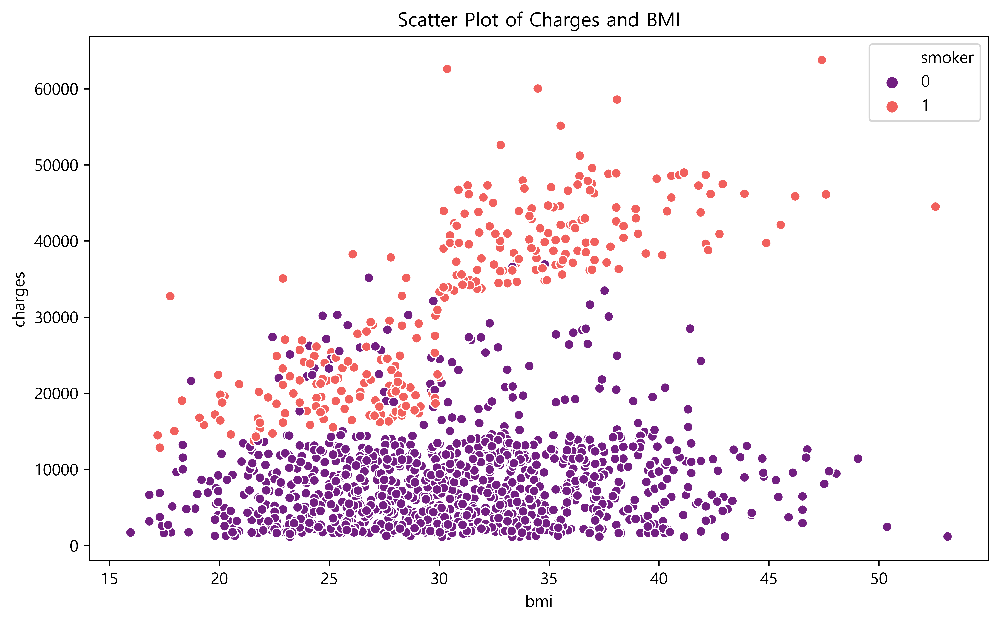

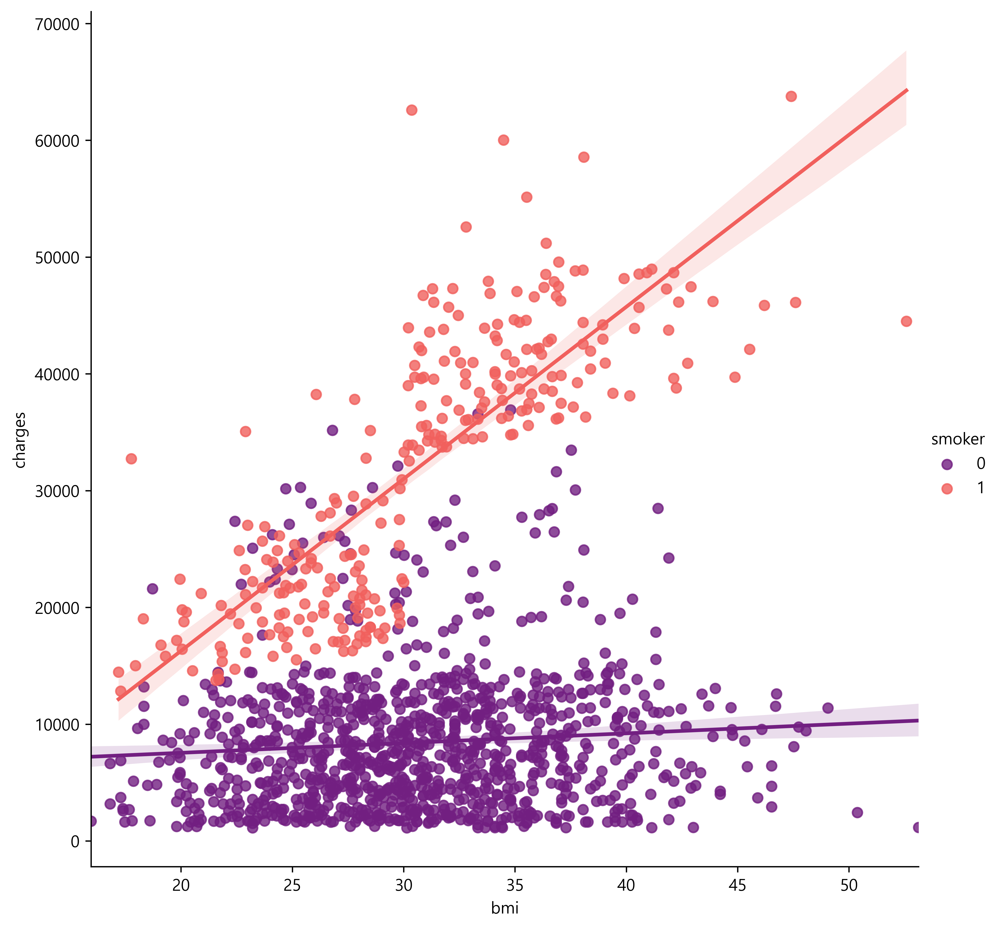

In [46]:
plt.figure(figsize=(10, 6))
ax = sns.scatterplot(x="bmi", y="charges", data=data, palette="magma", hue="smoker")
ax.set_title("Scatter Plot of Charges and BMI")

sns.lmplot(x="bmi", y="charges", hue="smoker", data=data, palette="magma", size=8)

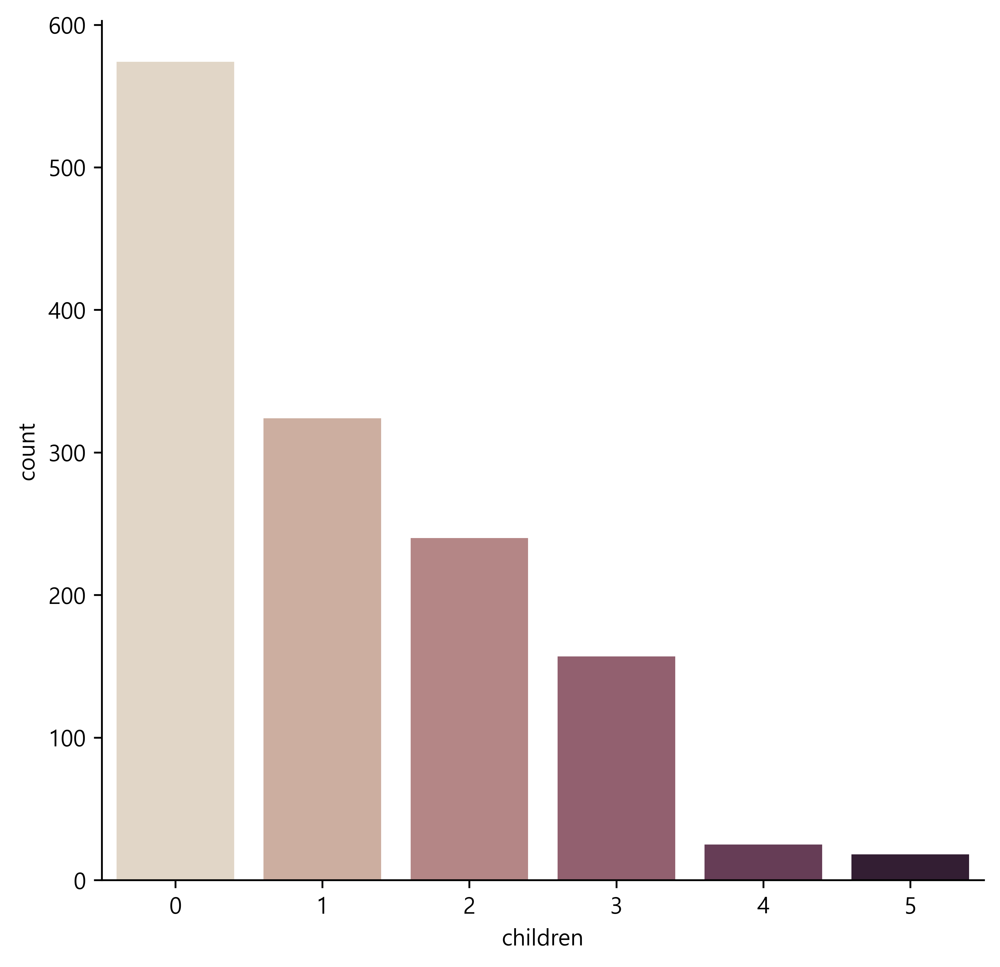

In [47]:
sns.catplot(x="children", kind="count", palette="ch:.25", data=data, size=6)

Text(0.5, 1.0, 'Smokers and Non-Smokers who have children')

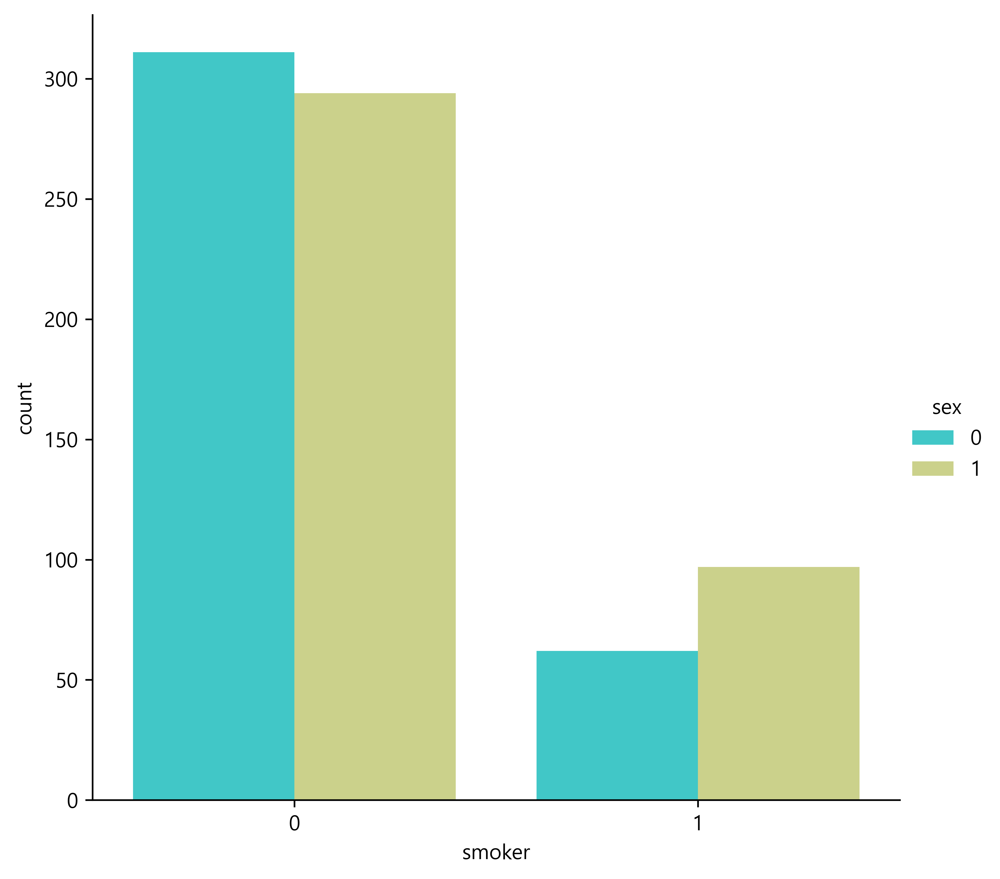

In [48]:
sns.catplot(x="smoker", kind="count", palette="rainbow", hue="sex", data=data[(data.children>0)], size=6)
ax.set_title("Smokers and Non-Smokers who have children")

In [49]:
from sklearn.linear_model import LinearRegression
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import PolynomialFeatures
from sklearn.metrics import r2_score, mean_squared_error
from sklearn.ensemble import RandomForestRegressor

In [50]:
x = data.drop(['charges'], axis=1)
y = data.charges
x_train, x_test, y_train, y_test = train_test_split(x, y, random_state=0)
lr = LinearRegression().fit(x_train, y_train)

y_train_pred = lr.predict(x_train)
y_test_pred = lr.predict(x_test)

print(lr.score(x_test, y_test))

0.7962732059725786


In [52]:
X = data.drop(['charges', 'region'], axis = 1)
Y = data.charges

quad = PolynomialFeatures(degree=2)
x_quad = quad.fit_transform(X)

X_train, X_test, Y_train, Y_test = train_test_split(x_quad, Y, random_state=0)

plr = LinearRegression().fit(X_train, Y_train)

Y_train_pred = plr.predict(X_train)
Y_test_pred = plr.predict(X_test)

print(plr.score(X_test, Y_test))

0.8849197344147238
